# Capstone Step 3 Exploratory Data Analysis

<font color = 'cyan'>Importing nessacary packages</font>

 **Exploratory Data Analysis involves** 
 * Build data profile tables and plots
        -Outliers & Anomalies
 * Explore data relationships
 * Identification and creation of features

In [1]:
import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import os
import seaborn as sns 
from scipy import stats
import cufflinks as cf
import plotly
import plotly.offline as py
import plotly.graph_objs as go

In [60]:
! pip install cufflings 

ERROR: Could not find a version that satisfies the requirement cufflings (from versions: none)
ERROR: No matching distribution found for cufflings


<font color='cyan'>Loading the csv file which is created in the end of step 2 from the data  folder.</font>


In [87]:
#Loading the csv file and storing it in a variable df and passing the date column in the argument parse_date
df = pd.read_csv('covid_updated_file.csv')

In [3]:
#Printing the current working directory
os.getcwd()

'C:\\Users\\user\\Springboard\\Course\\CapStone - 1'

In [4]:
#printing the first five rows of the dataframe df
df.head()

,Unnamed: 0,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cvd_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,0,AFG,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,0.00000,597.029,9.59,0.0,0.0,37.746,0.5,64.83
1,1,AFG,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.18058,597.029,9.59,0.0,0.0,37.746,0.5,64.83
2,2,AFG,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.18058,597.029,9.59,0.0,0.0,37.746,0.5,64.83
3,3,AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.18058,597.029,9.59,0.0,0.0,37.746,0.5,64.83
4,4,AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.18058,597.029,9.59,0.0,0.0,37.746,0.5,64.83


In [5]:
#Using info() print the count of nan values in the column of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28200 entries, 0 to 28199
Data columns (total 35 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Unnamed: 0                       28200 non-null  int64  
 1   iso_code                         28200 non-null  object 
 2   continent                        28200 non-null  object 
 3   location                         28200 non-null  object 
 4   date                             28200 non-null  object 
 5   total_cases                      28200 non-null  float64
 6   new_cases                        28200 non-null  float64
 7   total_deaths                     28200 non-null  float64
 8   new_deaths                       28200 non-null  float64
 9   total_cases_per_million          28200 non-null  float64
 10  new_cases_per_million            28200 non-null  float64
 11  total_deaths_per_million         28200 non-null  float64
 12  new_deaths_per_mil

In [6]:
#Printing the unique values of the location column
df['location'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao', 'Cyprus',
       'Czech Republic', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Faeroe Islands', 'Falkland Isla

<font color = 'cyan'>Build data profile tables and plots</font>

In [7]:
#Priting the summary statistics of the dataframe df in transposed manner
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,28200.0,1.409950e+04,8.140783e+03,0.000,7.049750e+03,1.409950e+04,2.114925e+04,2.819900e+04
total_cases,28200.0,1.836394e+04,1.117372e+05,0.000,1.500000e+01,2.700000e+02,3.028250e+03,2.888635e+06
new_cases,28200.0,4.048858e+02,2.364921e+03,-29726.000,0.000000e+00,4.000000e+00,7.100000e+01,5.477100e+04
total_deaths,28200.0,1.069110e+03,6.550781e+03,0.000,0.000000e+00,6.000000e+00,6.800000e+01,1.299470e+05
new_deaths,28200.0,1.893443e+01,1.201681e+02,-1918.000,0.000000e+00,0.000000e+00,1.000000e+00,4.928000e+03
total_cases_per_million,28200.0,8.660389e+02,2.224775e+03,0.000,3.698500e+00,9.692350e+01,6.185535e+02,3.463968e+04
new_cases_per_million,28200.0,1.579755e+01,6.269550e+01,-437.881,0.000000e+00,5.130000e-01,8.408000e+00,4.944376e+03
total_deaths_per_million,28200.0,3.454541e+01,1.151049e+02,0.000,0.000000e+00,1.012000e+00,1.433000e+01,1.237551e+03
new_deaths_per_million,28200.0,5.237889e-01,3.046836e+00,-41.023,0.000000e+00,0.000000e+00,1.010000e-01,2.000400e+02
total_tests,28200.0,5.252148e+05,1.883694e+06,0.000,5.064053e+04,1.501202e+05,3.712316e+05,3.485843e+07


In [9]:
df[['iso_code','location']]

,iso_code,location
0,AFG,Afghanistan
1,AFG,Afghanistan
2,AFG,Afghanistan
3,AFG,Afghanistan
4,AFG,Afghanistan
...,...,...
28195,ZWE,Zimbabwe
28196,ZWE,Zimbabwe
28197,ZWE,Zimbabwe
28198,ZWE,Zimbabwe


 The ISO country codes are internationally recognized codes that designate every country and most of the dependent areas a two-letter combination or a three-letter combination; it is like an acronym, that stands for a country or a state. Therefore dropping iso_code from the dataframe df.

In [88]:
#Drop the iso_code column from the dataframe df using df.drop()
df=df.drop(columns=['iso_code'],axis=1)
#Drop the column Unnamed: 0 from the dataframe df
df=df.drop(columns=['Unnamed: 0'],axis=1)
#Printing the first five rows
df.head()

,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cvd_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,0.00000,597.029,9.59,0.0,0.0,37.746,0.5,64.83
1,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.18058,597.029,9.59,0.0,0.0,37.746,0.5,64.83
2,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.18058,597.029,9.59,0.0,0.0,37.746,0.5,64.83
3,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.18058,597.029,9.59,0.0,0.0,37.746,0.5,64.83
4,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.18058,597.029,9.59,0.0,0.0,37.746,0.5,64.83


<font color = 'cyan'>Anamolies & outliers - review boxplots</font>

In [12]:
#printing the columns of the dataframe df
df.columns

Index(['continent', 'location', 'date', 'total_cases', 'new_cases',
       'total_deaths', 'new_deaths', 'total_cases_per_million',
       'new_cases_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'tests_units',
       'stringency_index', 'population', 'population_density', 'median_age',
       'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cvd_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy'],
      dtype='object')

In [13]:
#Box plots are very effective in getting info about outliers
#Plotting box plot for each column 

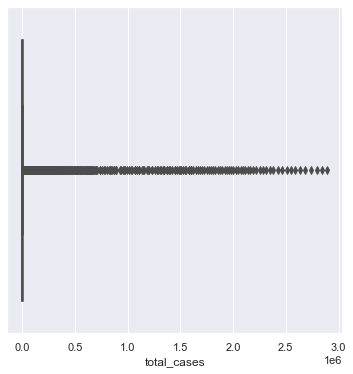

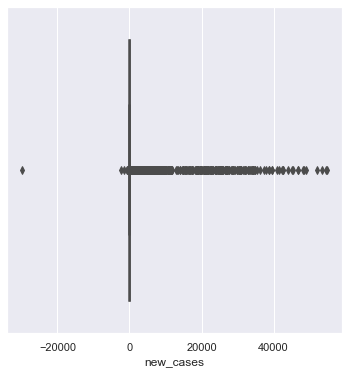

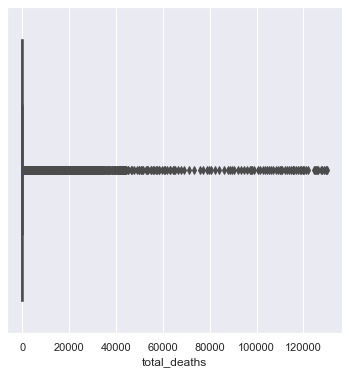

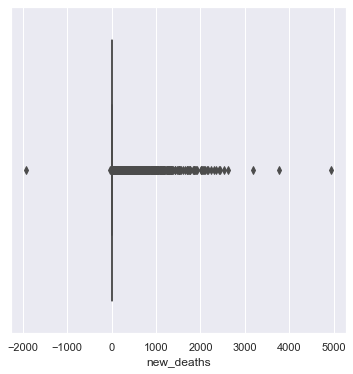

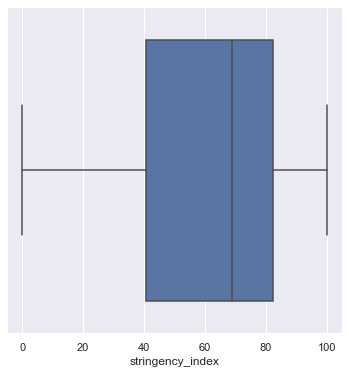

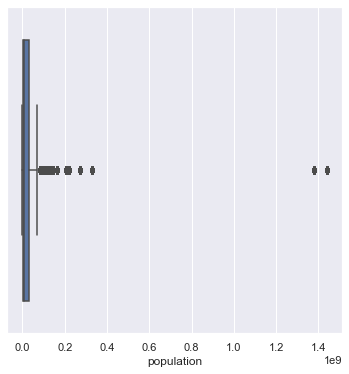

In [14]:
sns.set(rc ={"figure.figsize":(6,6)})
sns.boxplot(x=df['total_cases'])
plt.show()
sns.boxplot(x=df['new_cases'])
plt.show()
sns.boxplot(x=df['total_deaths'])
plt.show()
sns.boxplot(x=df['new_deaths'])
plt.show()
sns.boxplot(x=df['stringency_index'])
plt.show()
sns.boxplot(x=df['population'])
plt.show()

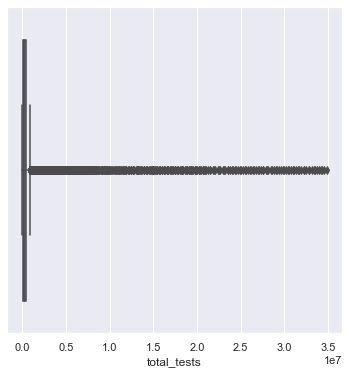

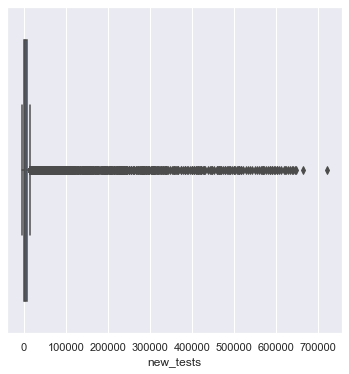

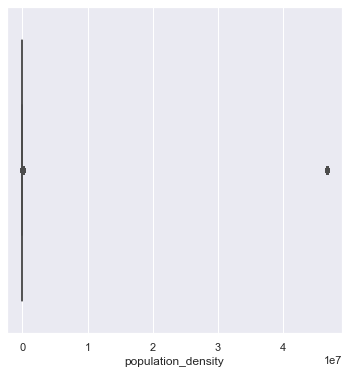

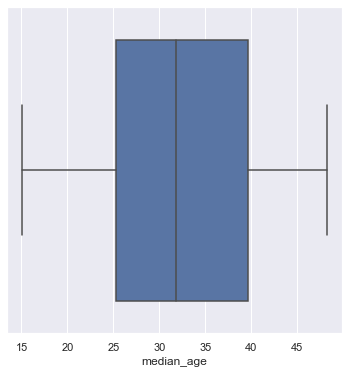

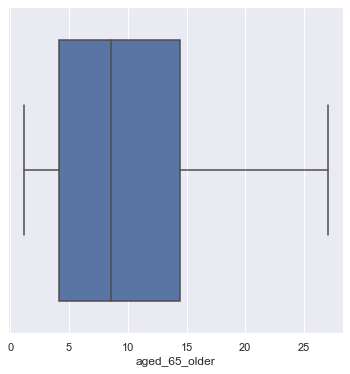

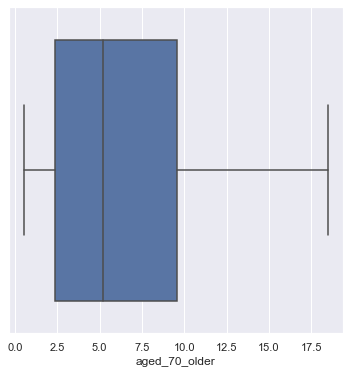

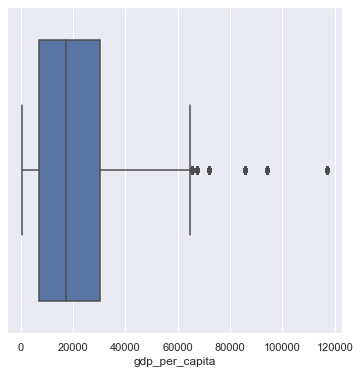

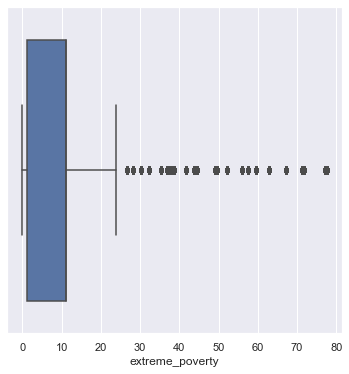

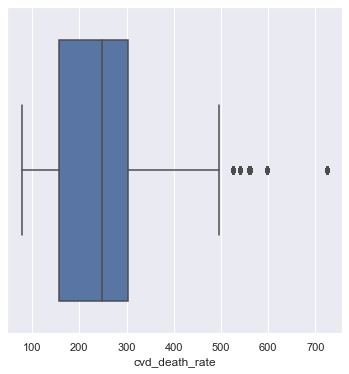

In [15]:
sns.boxplot(x=df['total_tests'])
plt.show()
sns.boxplot(x=df['new_tests'])
plt.show()
sns.boxplot(x=df['population_density'])
plt.show()
sns.boxplot(x=df['median_age'])
plt.show()
sns.boxplot(x=df['aged_65_older'])
plt.show()
sns.boxplot(x=df['aged_70_older'])
plt.show()
sns.boxplot(x=df['gdp_per_capita'])
plt.show()
sns.boxplot(x=df['extreme_poverty'])
plt.show()
sns.boxplot(x=df['cvd_death_rate'])
plt.show()  

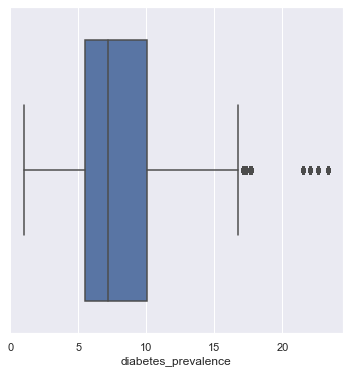

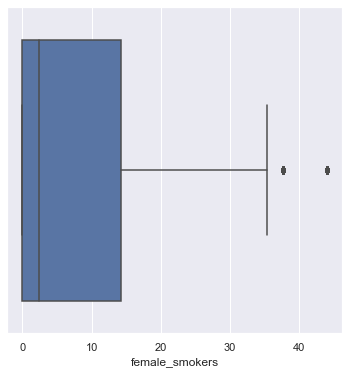

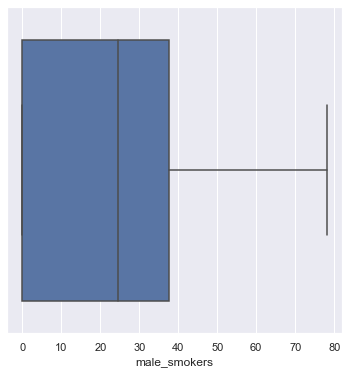

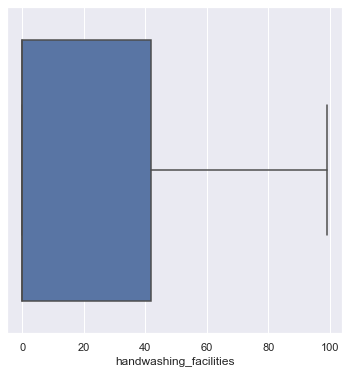

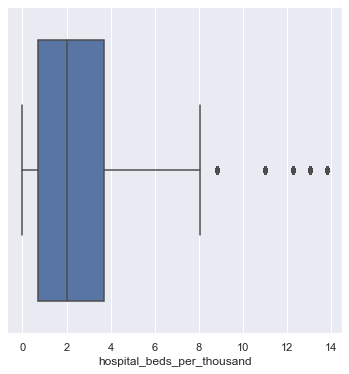

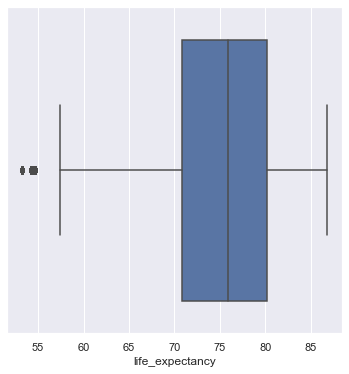

In [16]:
sns.boxplot(x=df['diabetes_prevalence'])
plt.show()
sns.boxplot(x=df['female_smokers'])
plt.show()
sns.boxplot(x=df['male_smokers'])
plt.show()
sns.boxplot(x=df['handwashing_facilities'])
plt.show()
sns.boxplot(x=df['hospital_beds_per_thousand'])
plt.show()  
sns.boxplot(x=df['life_expectancy'])
plt.show()  

In [17]:
df.shape

(28200, 33)

<font color = 'teal'>Removing outliers using the Interquartile range</font>

In [ ]:
#calculate z-scores of `df`
z_scores = stats.zscore(df.drop(columns = ['continent','location','date','tests_units',],axis =1))
#Pass the zscores as argument in np.abs()
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)
df = df[filtered_entries]

In [ ]:
df.head()

In [ ]:
df.shape

In [ ]:
#reseting index of the dataframe using reset_index()
df.reset_index(inplace=True, drop=True)
df.head()


<font color = 'teal'>Univariate data explorations </font>

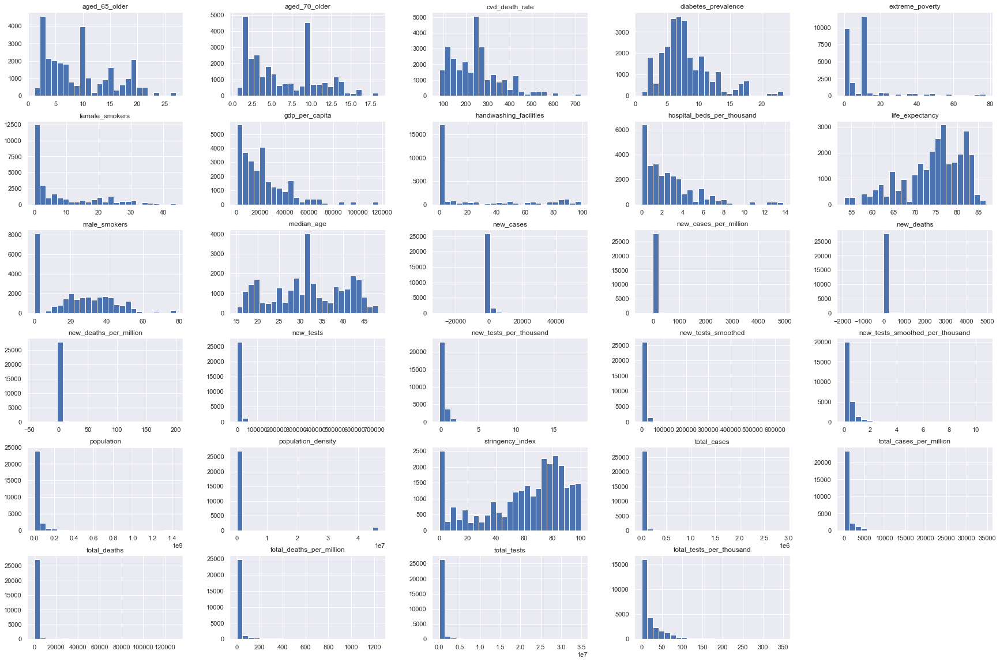

In [18]:
box=df.hist(bins=25,figsize =(30,20))
plt.show()

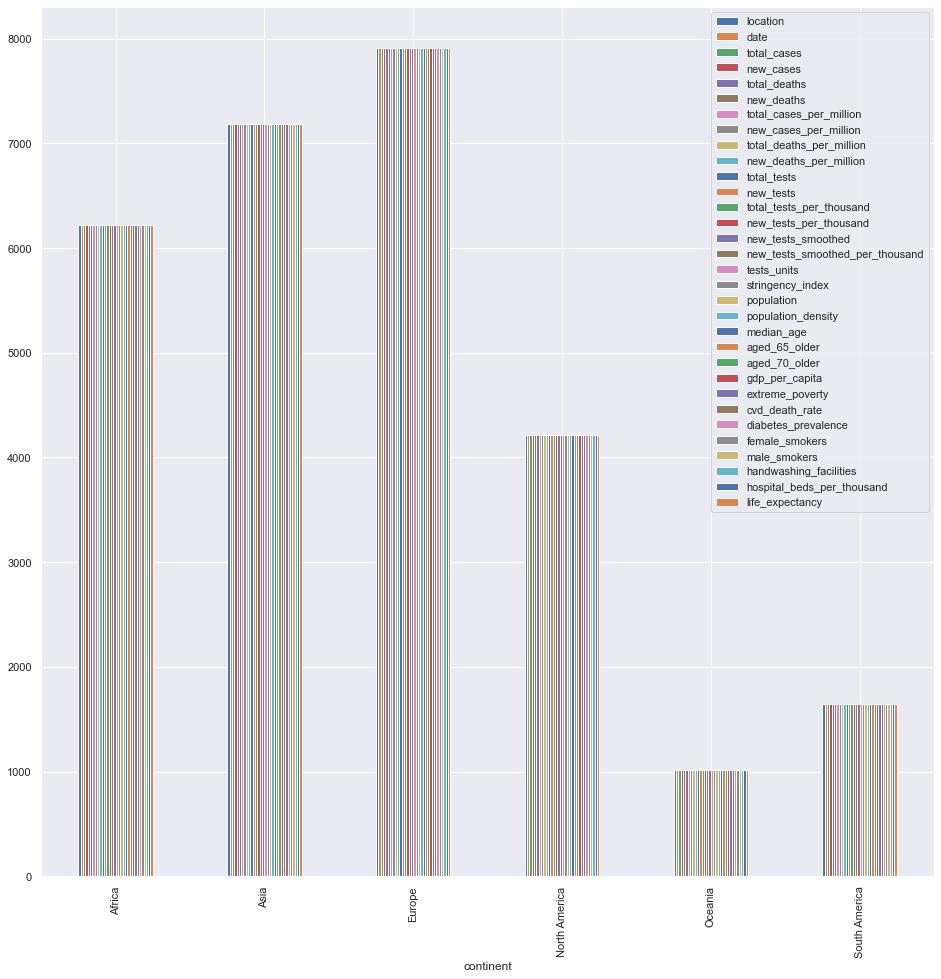

In [19]:
df.groupby('continent').count().plot(kind='bar',figsize =(16,16))

<font color ='teal'> Bivariate data explorations </font>

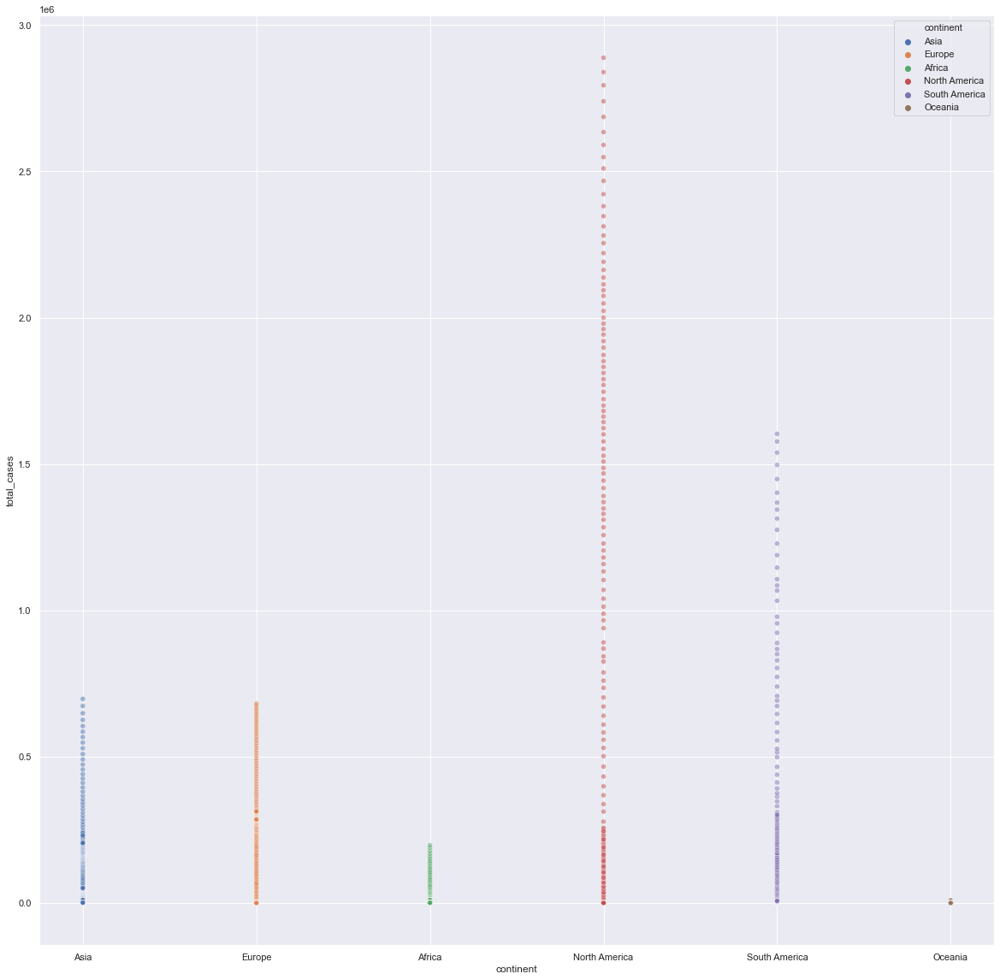

In [20]:
sns.set(rc ={"figure.figsize":(20,20)})
sns.scatterplot(x='continent',y = 'total_cases' , data = df,alpha = 0.5,hue ='continent')

From the above scatter plot we can see that North America have more no of covid-19 cases compared to others continents and Oceanis have least count of covid-19 cases. 

In [21]:
US_Brazil = df[ (df['location']=='United States') | (df['location'] == 'Brazil')]

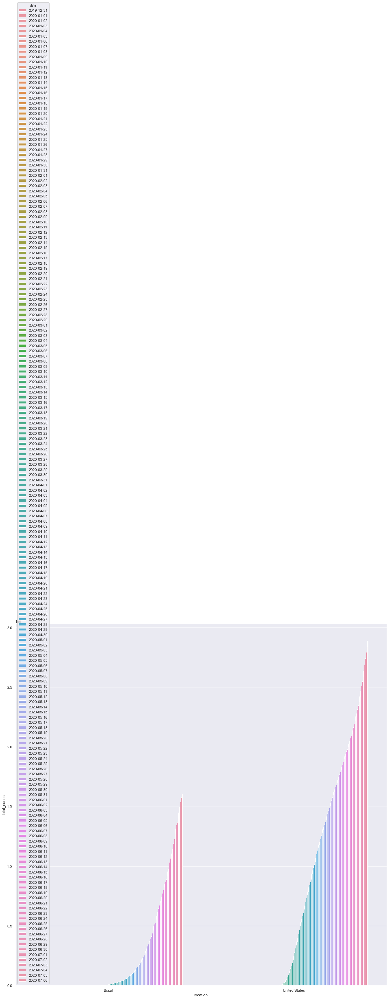

In [22]:
sns.set(rc ={"figure.figsize":(20,20)})
sns.barplot(x='location',y='total_cases',data=US_Brazil,hue ='date')
plt.show()

From the above barplot we can observe that the first confirmed cases of covid-19 in United States was reported on march month of 2020 and the count drastically increased. And first covid-19 confirmed cases in Brazil was reported on april month of 2020. Comparing to United States the count is less, though it also have drastic increase in covid-19 case count.

In [23]:
China_India = df[(df['location']=='China') | (df['location']=='India')]

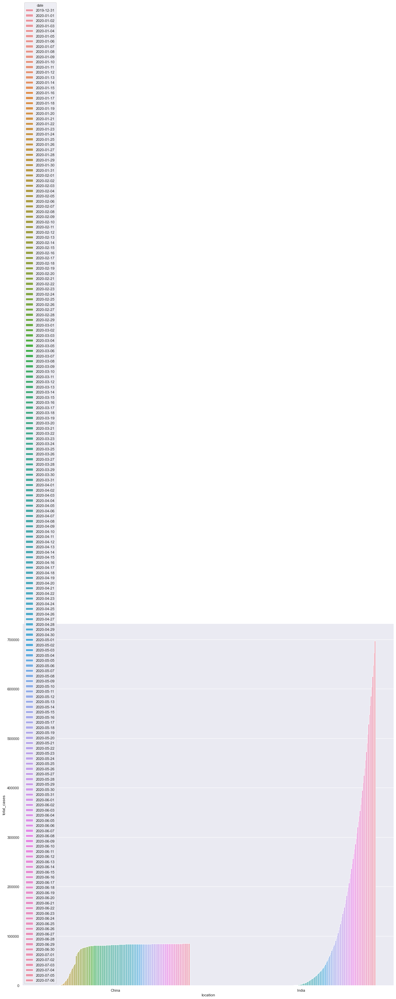

In [24]:
sns.set(rc={'figure.figsize': (20,20)})
sns.barplot(x='location',y='total_cases',data=China_India,hue ='date')
plt.show()

The outbreak was first identified in Wuhan, China, in December 2019. From the above bar plot we can observe the same. Eventhough it started very early in China we can observe that at first it started to increase and after january,2020 the cases are kept under control as we can see a constant curve. The first covid-19 case in India was reported in March,2020 and had a drastic increase in total numbers of cases when compared with China.

In [25]:
spain_germany = df[(df['location']=='Spain') | (df['location'] == 'Germany')]

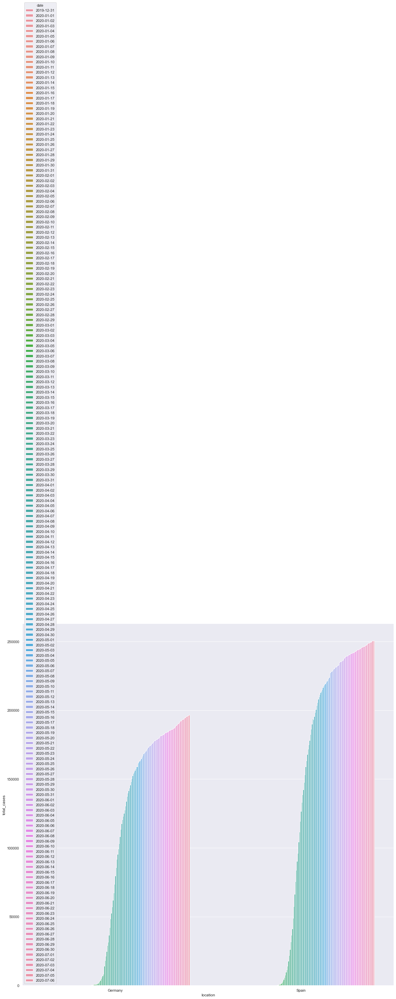

In [26]:
sns.set(rc={'figure.figsize': (20,20)})
sns.barplot(x='location',y='total_cases',data=spain_germany,hue ='date')
plt.show()

From the above barplot we can see that the first covid-19 case was almost reported around the same time both in Germany and Spain. And we can see a drastic increase in countin both countries. Spain has more cases when compared with Germany.

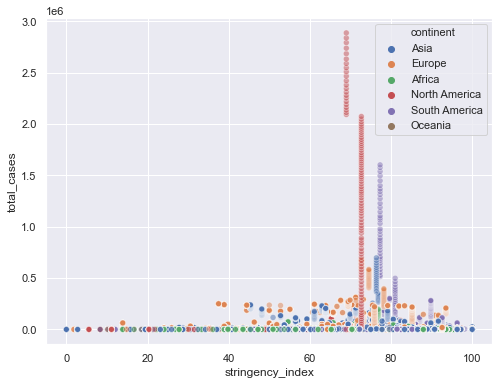

In [27]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'stringency_index', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

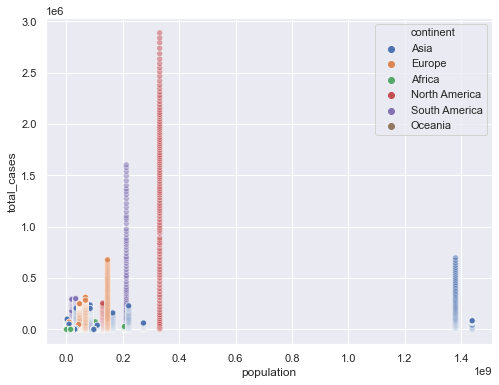

In [28]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'population', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

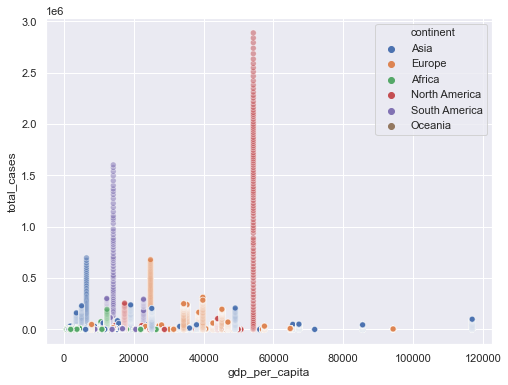

In [29]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'gdp_per_capita', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

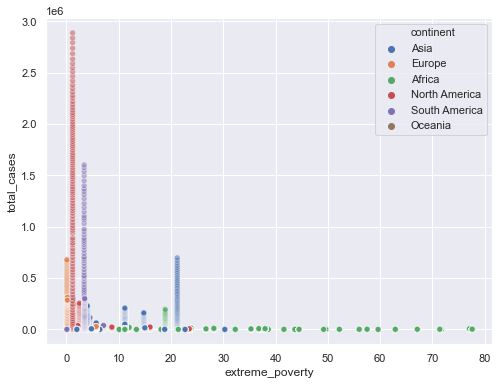

In [30]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'extreme_poverty', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

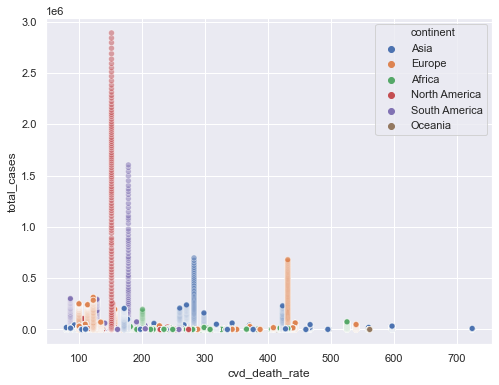

In [31]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'cvd_death_rate', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

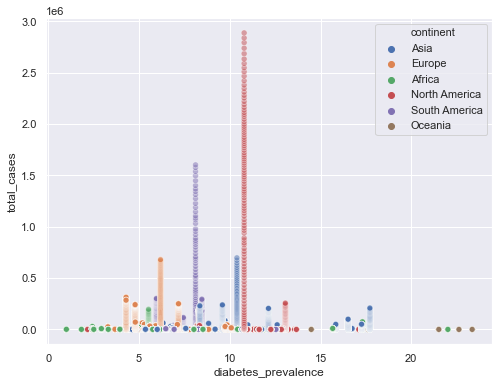

In [32]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'diabetes_prevalence', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

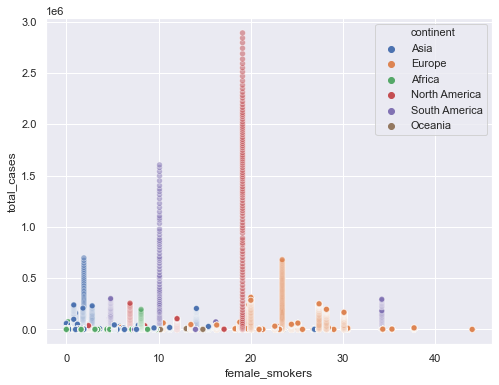

In [33]:
sns.scatterplot(x = 'female_smokers', y ='total_cases' ,data = df,alpha = 0.5,color = 'g',hue = 'continent')

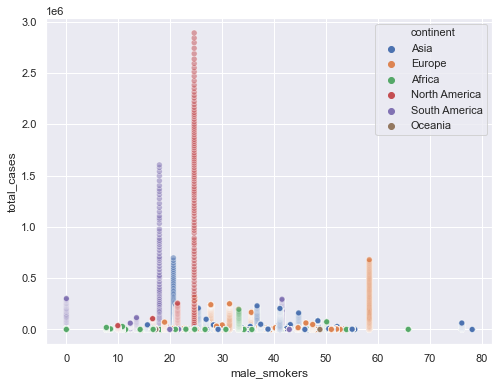

In [34]:
sns.scatterplot(x = 'male_smokers', y ='total_cases' ,data = df,alpha = 0.5,color = 'g',hue = 'continent')

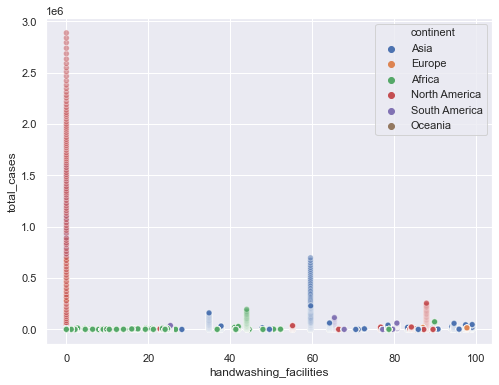

In [35]:
sns.scatterplot(x = 'handwashing_facilities', y ='total_cases' ,data = df,alpha = 0.5,color = 'g',hue = 'continent')

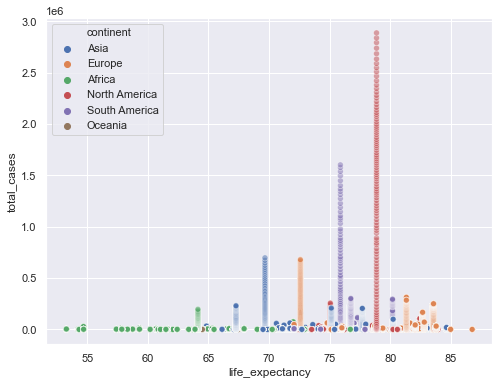

In [36]:
sns.scatterplot(x = 'life_expectancy', y ='total_cases' ,data = df,alpha = 0.5,color = 'g',hue = 'continent')

In [68]:
cf.go_offline() # required to use plotly offline (no account required).
py.init_notebook_mode() # graphs charts inline (IPython).

In [89]:
df.date = pd.to_datetime(df.date)
df.date.sort_values().index
df_by_date = df.iloc[df.date.sort_values().index]

In [100]:
Cases_by_date = df_by_date.groupby('date')['total_cases'].sum()
Cases_by_date.iplot(kind='bar', title='total cases per day')

In [99]:
Deaths_by_date = df_by_date.groupby('date')['total_deaths'].sum()
Deaths_by_date.iplot(kind='bar', title='Deaths per day')

In [97]:
Cases_deaths = pd.DataFrame({'Total_Cases':Cases_by_date, 'Total_deaths':Deaths_by_date })

color1 = '#9467bd'
color2 = '#F08B00'

trace1 = go.Scatter(
    x = Cases_deaths.index,
    y = Cases_deaths['Total_Cases'],
    name='Total_Cases',
    line = dict(
        color = color1
    )
)
trace2 = go.Scatter(
    x= Cases_deaths.index,
    y =Cases_deaths['Total_deaths'] ,
    name='Total_deaths',
    yaxis='y2',
    mode='markers'

)
data = [trace1, trace2]
layout = go.Layout(
    title= "Total Cases and Deaths per day",
    yaxis=dict(
        title='Total_cases',
        titlefont=dict(
            color=color1
        ),
        tickfont=dict(
            color=color1
        )
    ),
    yaxis2=dict(
        title='Total deaths',
        overlaying='y',
        side='right',
        titlefont=dict(
            color=color2
        ),
        tickfont=dict(
            color=color2
        )

    )

)
fig = go.Figure(data=data, layout=layout)
plot_url = py.iplot(fig)

In [109]:
Cases_by_date = df_by_date.groupby('date')['stringency_index'].sum()
Cases_by_date.iplot(kind='scatter', title='Strictness of lockdown per day')

# Explore Data Relationships

<font color = 'teal'> Create pairplots for the dataframe to explore the data relationships </font>

A pairs plot allows us to see both distribution of single variables and relationships between two variables. Pair plots are a great method to identify trends. Create pairplot for the dataframe df using sns.pairplot().

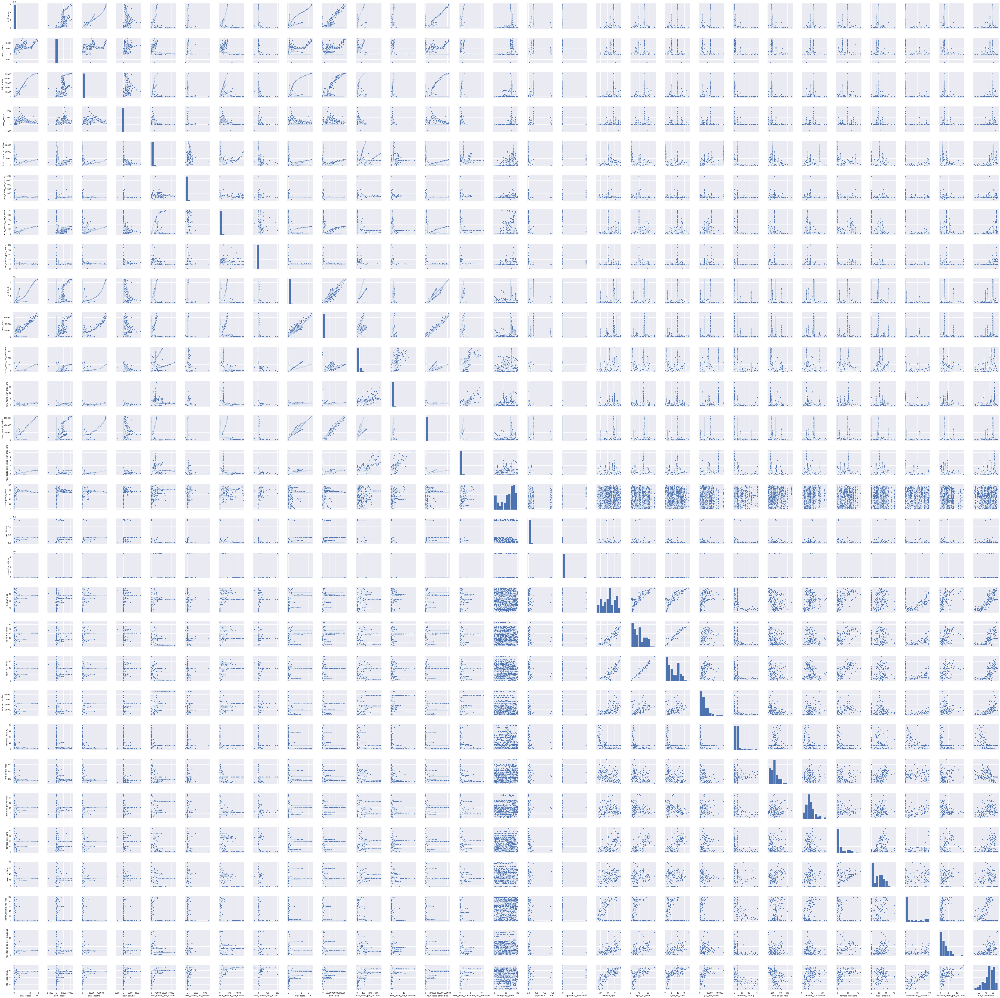

In [46]:
df_PairPlot=sns.pairplot(df)

# Feature Identification

<font color = 'teal'>Create a heatmap to find the correlations between the features of the dataframe df</font>

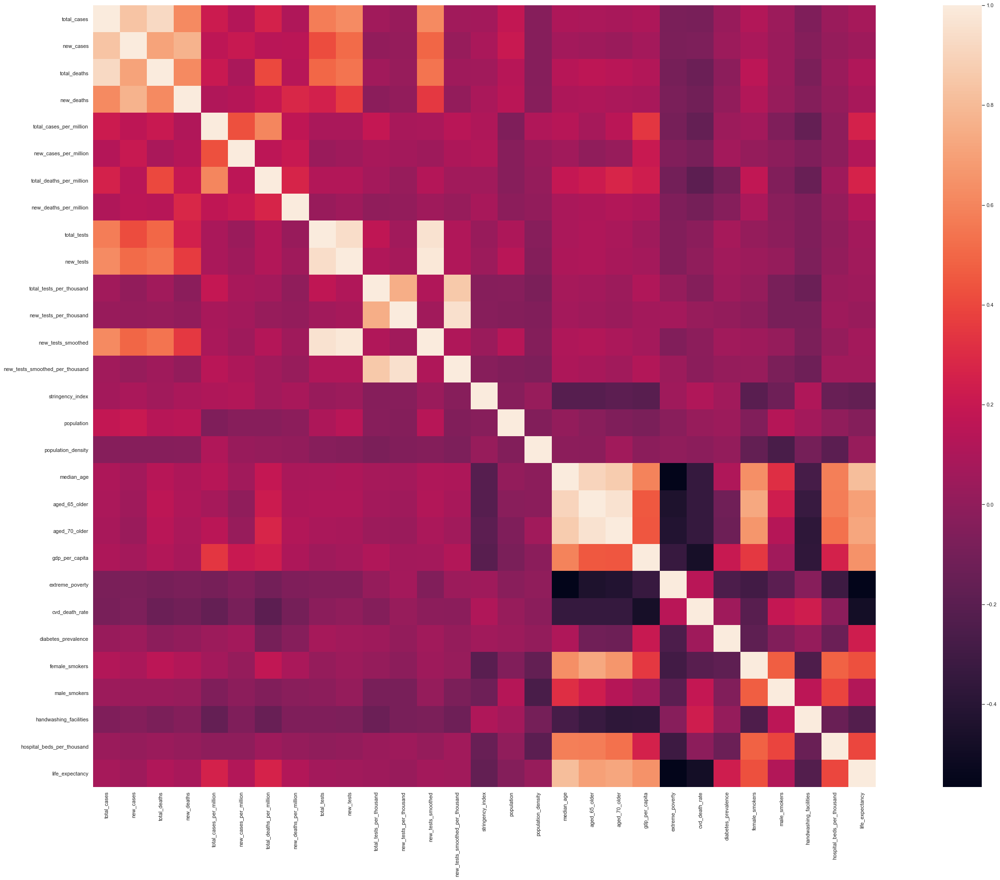

In [47]:
#Lets plot the heatmap to find correlation among the features
sns.set(rc={'figure.figsize': (50,30)})
corr = df.corr()
sns.heatmap(corr,square = True)

In [48]:
#Step 1. Call the variable corr_matrix
corr_matrix = df.drop(['total_cases','new_cases','total_deaths','new_deaths'], axis=1).corr().abs()

#Step 2.the following code is to get the upper triangle of the correlation matrix 
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

#Step 3. This code iterates through our columns and gets the index of any that have a correlation > 0.95
#Call the variable to_drop and store the column that are more than 90% correlated for removal.
to_drop = [column for column in upper.columns if any(upper[column] > 0.90)]

In [ ]:
#Priting the column names which are 90% correlated for removal 
print('Features selected to drop is ',to_drop)

In [ ]:
#Now drop the columns from the datafram df which are more than 90% correlated for removal
df = df.drop(df[to_drop],axis=1)

In [ ]:
df.shape

<font color = 'teal'>Feature Creation</font>